<a href="https://colab.research.google.com/github/Lydia-byte-rgb/Capstone-Project--Group-10/blob/main/capstone_project_group_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Forecasting and Monitoring Hospitalization Trends from Respiratory Viruses in Kenya: A Time Series Analysis by County
 (Using U.S. Government Data as a Proxy)


## Business Understanding

Kenya faces challenges in tracking and predicting hospitalizations caused by respiratory viruses like COVID-19, Influenza, and RSV due to limited real-time health data. Since local data is scarce, this project uses public hospitalization records from the United States (provided by agencies like the CDC and HHS) as a reliable substitute. By analyzing these structured records, the project demonstrates how a data-driven approach could be applied in Kenya in the future. The goal is to develop a system that can forecast hospitalization trends, detect unexpected surges, and support timely public health actions. When Kenya establishes a similar data infrastructure, the insights from this study can help shape policies, allocate resources, and improve healthcare preparedness.

# Problem Statement

Kenya lacks a robust real-time health surveillance system to track and predict hospitalizations caused by respiratory viruses like COVID-19, Influenza, and RSV. The absence of structured local data makes it difficult to anticipate hospitalization trends and respond effectively to surges. By leveraging publicly available U.S. hospitalization data as a proxy, this project aims to demonstrate how a data-driven forecasting approach could be implemented in Kenya. The ultimate goal is to support timely public health interventions, optimize resource allocation, and enhance preparedness once a local data infrastructure is established.

# Objectives
  To monitor, model, and forecast respiratory virus-related hospitalization   

1.     To monitor, model, and forecast COVID-19 hospitalization trends across U.S. states to support healthcare resource planning, outbreak response, and policy decisions.

2. Detect patterns and seasonality in COVID-19 hospitalizations.
3.  Forecast future hospitalization trends at the national level.
4. Evaluate the impact of interventions (vaccinations, NPIs) on hospitalization metrics.
5. Provide real-time dashboards for public health stakeholders.


## **Stakeholders**
1. Mnistry of health and local health departments
2. Hospital administrators and planners
3. Epidemiologists and public health researchers
4. Policy-makers and emergency response teams



EDA



In [ ]:
!pip install statsmodels


In [ ]:
!pip install sktime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.0/37.0 MB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.5/145.5 kB 10.4 MB/s eta 0:00:00
  Attempting uninstall: joblib
    Found existing installation: joblib 1.5.0
    Uninstalling joblib-1.5.0:
      Successfully uninstalled joblib-1.5.0


In [ ]:
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from sklearn.impute import SimpleImputer
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf





In [ ]:
# load the dataset
rvr_df = pd.read_csv("/content/RVR.csv")
rvr_df.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,...,absolute_change_average_percent_staff_pediatric_icu_beds_occupied,admissions_00_04_covid_confirmed,admissions_05_11_covid_confirmed,admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed,average_admissions_05_11_covid_confirmed,average_admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed_per_100k,average_admissions_05_11_covid_confirmed_per_100k,average_admissions_12_17_covid_confirmed_per_100k
0,AZ,8/1/2020,55,95,95,26,16,35,16.0,6,...,3.774523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AZ,8/2/2020,76,95,124,29,24,34,12.0,8,...,-0.040802,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AZ,8/3/2020,82,95,100,26,21,28,14.0,13,...,-8.305584,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AZ,8/4/2020,81,95,121,32,23,32,12.0,12,...,-5.207254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AZ,8/5/2020,84,95,120,27,28,35,14.0,14,...,-5.779696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
rvr_df.tail()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,...,absolute_change_average_percent_staff_pediatric_icu_beds_occupied,admissions_00_04_covid_confirmed,admissions_05_11_covid_confirmed,admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed,average_admissions_05_11_covid_confirmed,average_admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed_per_100k,average_admissions_05_11_covid_confirmed_per_100k,average_admissions_12_17_covid_confirmed_per_100k
39227,Region 3,6/6/2021,394,417,157,43,30,63,32.0,11,...,-0.421114,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39228,Region 3,6/7/2021,394,417,144,38,22,54,21.0,16,...,-0.111721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39229,Region 3,6/8/2021,394,417,169,46,30,66,27.0,18,...,0.611100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39230,Region 3,6/9/2021,394,417,174,43,40,59,27.0,22,...,1.026071,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39231,Region 3,6/10/2021,394,417,171,38,41,66,35.0,20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(rvr_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39232 entries, 0 to 39231
Columns: 115 entries, jurisdiction to average_admissions_12_17_covid_confirmed_per_100k
dtypes: float64(99), int64(14), object(2)
memory usage: 34.4+ MB
None


In [ ]:
#display descriptive statistics
rvr_df.describe()

,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,admissions_40_49_covid_confirmed,admissions_18_29_covid_confirmed,...,absolute_change_average_percent_staff_pediatric_icu_beds_occupied,admissions_00_04_covid_confirmed,admissions_05_11_covid_confirmed,admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed,average_admissions_05_11_covid_confirmed,average_admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed_per_100k,average_admissions_05_11_covid_confirmed_per_100k,average_admissions_12_17_covid_confirmed_per_100k
count,39232.000000,39232.000000,39232.000000,39232.000000,39232.000000,39232.000000,39153.000000,39232.000000,39154.000000,39232.000000,...,35033.000000,22201.000000,22201.000000,22201.000000,22201.000000,22201.000000,22201.000000,21306.000000,21306.000000,21306.000000
mean,105.972497,112.061761,107.414891,45.444255,15.838805,34.081490,14.202973,7.286756,8.569086,5.592781,...,0.063224,1.733075,0.559389,0.588622,1.737779,0.561172,0.591833,0.485588,0.151161,0.167223
std,96.878062,101.507428,188.698343,78.298486,31.744210,63.586745,28.192527,14.745950,17.485919,10.947655,...,6.892324,2.790930,1.090540,1.222497,2.482578,0.860961,0.996463,0.539118,0.344397,0.338316
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-101.386503,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,43.000000,48.000000,16.000000,6.000000,2.000000,4.000000,1.000000,1.000000,1.000000,0.000000,...,-2.327970,0.000000,0.000000,0.000000,0.285714,0.000000,0.000000,0.156633,0.000000,0.000000
50%,86.000000,91.000000,44.000000,19.000000,6.000000,13.000000,5.000000,3.000000,3.000000,2.000000,...,0.027657,1.000000,0.000000,0.000000,1.000000,0.285714,0.285714,0.338422,0.051922,0.065339
75%,137.000000,148.000000,118.000000,51.000000,17.000000,36.000000,15.000000,8.000000,9.000000,6.000000,...,2.398703,2.000000,1.000000,1.000000,2.142857,0.714286,0.714286,0.628744,0.125256,0.163510
max,473.000000,476.000000,2911.000000,1155.000000,582.000000,893.000000,445.000000,286.000000,327.000000,230.000000,...,113.206116,27.000000,14.000000,19.000000,23.428571,8.857143,15.285714,7.242361,3.103934,4.440280


In [ ]:
#checking for missing values
print(rvr_df.isna().sum())

jurisdiction                                             0
collection_date                                          0
number_hospitals_reporting_today                         0
total_hospitals                                          0
admissions_all_covid_confirmed                           0
                                                     ...  
average_admissions_05_11_covid_confirmed             17031
average_admissions_12_17_covid_confirmed             17031
average_admissions_00_04_covid_confirmed_per_100k    17926
average_admissions_05_11_covid_confirmed_per_100k    17926
average_admissions_12_17_covid_confirmed_per_100k    17926
Length: 115, dtype: int64


In [ ]:
#checking for duplicates
rvr_df.duplicated().sum()

np.int64(0)

In [ ]:
# Getting the sum of missing values for each column
missing_values_sum = rvr_df.isna().sum()
top_missing_columns = missing_values_sum.sort_values(ascending=False)

top_30_missing = top_missing_columns.head(30)
print("\nTop 30 columns with missing values:")
print(top_30_missing)
total_missing_in_top_30 = top_30_missing.sum()

print(f"\nTotal sum of missing values in the top 30 columns: {total_missing_in_top_30}")



Top 30 columns with missing values:
average_admissions_0_17_covid_confirmed_per_100k                               17926
average_admissions_12_17_covid_confirmed_per_100k                              17926
average_admissions_05_11_covid_confirmed_per_100k                              17926
average_admissions_00_04_covid_confirmed_per_100k                              17926
admissions_00_04_covid_confirmed                                               17031
admissions_12_17_covid_confirmed                                               17031
average_admissions_05_11_covid_confirmed                                       17031
admissions_05_11_covid_confirmed                                               17031
average_admissions_00_04_covid_confirmed                                       17031
average_admissions_0_17_covid_confirmed                                        17031
average_admissions_12_17_covid_confirmed                                       17031
admissions_0_17_covid_confir

In [ ]:
# Calculate the percentage of missing values for the top 10 columns
total_rows = len(rvr_df)
top_30_missing_percentage = (top_30_missing / total_rows) * 100
print("\nPercentage of missing values for the top 10 columns:")
top_30_missing_percentage


Percentage of missing values for the top 10 columns:


,0
average_admissions_0_17_covid_confirmed_per_100k,45.692292
average_admissions_12_17_covid_confirmed_per_100k,45.692292
average_admissions_05_11_covid_confirmed_per_100k,45.692292
average_admissions_00_04_covid_confirmed_per_100k,45.692292
admissions_00_04_covid_confirmed,43.410991
admissions_12_17_covid_confirmed,43.410991
average_admissions_05_11_covid_confirmed,43.410991
admissions_05_11_covid_confirmed,43.410991
average_admissions_00_04_covid_confirmed,43.410991
average_admissions_0_17_covid_confirmed,43.410991


The data understanding phase involved:

1.  **Loading and Initial Inspection:** The data was loaded into a pandas DataFrame (`rvr_df`). Basic inspection was performed using `head()`, `tail()`, `info()`, and `describe()` to get an overview of the data's structure, column types, and summary statistics.
2.  **Checking for Missing Values:** The presence of missing values was assessed using `isna().sum()`. The columns with the most missing values were identified and their counts and percentages were displayed to understand the extent of the missing data problem.
3.  **Checking for Duplicates:** The number of duplicate rows was checked using `duplicated().sum()`.

This initial exploration helped in identifying the scale of missing data which would be addressed in subsequent cleaning steps.

#Data Cleaning

In [ ]:
#make a copy
admissions_df = rvr_df.copy()

In [ ]:
#drop columns
missing_fraction = admissions_df.isnull().mean()
cols_to_drop = missing_fraction[missing_fraction >= 0.4].index
df_clean = admissions_df.drop(columns=cols_to_drop)

In [ ]:
df_clean.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,...,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_influenza,average_percent_staff_icu_beds_influenza,absolute_change_average_percent_staff_icu_beds_influenza,absolute_change_average_percent_adult_inpatient_beds_occupied,absolute_change_average_percent_pediatric_inpatient_beds_occupied,absolute_change_average_percent_staff_adult_icu_beds_occupied,absolute_change_average_percent_staff_pediatric_icu_beds_occupied
0,AZ,8/1/2020,55,95,95,26,16,35,16.0,6,...,0.0,0.0,0.0,0.0,0.0,0.0,-4.736754,27.477002,-4.678492,3.774523
1,AZ,8/2/2020,76,95,124,29,24,34,12.0,8,...,0.0,0.0,0.0,0.0,0.0,0.0,-3.808385,18.051452,-3.284308,-0.040802
2,AZ,8/3/2020,82,95,100,26,21,28,14.0,13,...,0.0,0.0,0.0,0.0,0.0,0.0,-2.949899,10.744193,-2.437162,-8.305584
3,AZ,8/4/2020,81,95,121,32,23,32,12.0,12,...,0.0,0.0,0.0,0.0,0.0,0.0,-2.521649,5.184559,-1.014152,-5.207254
4,AZ,8/5/2020,84,95,120,27,28,35,14.0,14,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.633140,1.158006,-0.110215,-5.779696


In [ ]:
#verify the result
admissions_df.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,...,absolute_change_average_percent_staff_pediatric_icu_beds_occupied,admissions_00_04_covid_confirmed,admissions_05_11_covid_confirmed,admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed,average_admissions_05_11_covid_confirmed,average_admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed_per_100k,average_admissions_05_11_covid_confirmed_per_100k,average_admissions_12_17_covid_confirmed_per_100k
0,AZ,8/1/2020,55,95,95,26,16,35,16.0,6,...,3.774523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AZ,8/2/2020,76,95,124,29,24,34,12.0,8,...,-0.040802,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AZ,8/3/2020,82,95,100,26,21,28,14.0,13,...,-8.305584,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AZ,8/4/2020,81,95,121,32,23,32,12.0,12,...,-5.207254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AZ,8/5/2020,84,95,120,27,28,35,14.0,14,...,-5.779696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Confirming dropped columns and calculating percentage
missing_values = df_clean.isna().sum()
missing_val_columns = missing_values.sort_values(ascending=False)

rows = len(df_clean)
missing_val_percentage = (missing_val_columns.head(10) / rows) * 100
print("\nPercentage of missing values for the top 10 columns after dropping:")
missing_val_percentage


Percentage of missing values for the top 10 columns after dropping:


,0
percent_change_total_admissions_all_influenza_confirmed_past_7days,20.965029
percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,20.965029
percent_staff_pediatric_icu_beds_occupied,11.266313
percent_staff_pediatric_icu_beds_covid,11.266313
staff_icu_pediatric_patients_covid_confirmed,11.263764
total_staffed_pediatric_icu_beds,11.263764
staff_pediatric_icu_beds_occupied,11.263764
absolute_change_average_percent_staff_pediatric_icu_beds_occupied,10.702998
average_percent_staff_pediatric_icu_beds_covid,10.017333
average_percent_staff_pediatric_icu_beds_occupied,10.017333


Checking for skewness in the data so as to guide the decision on how to impute the data

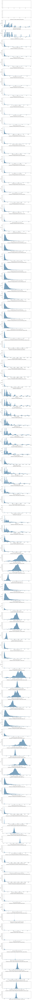

In [ ]:
#checking for skewness
fig, axes = plt.subplots(nrows=len(df_clean.columns), figsize=(10, 3*len(df_clean.columns)))
for i, col in enumerate(df_clean.columns):
    if pd.api.types.is_numeric_dtype(df_clean[col]):
        sns.histplot(df_clean[col], kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

In [ ]:
#calculate the skewness of various columns
skewness = df_clean.select_dtypes(include=['float64', 'int64']).skew()
print(skewness)

number_hospitals_reporting_today                                     2.012688
total_hospitals                                                      1.974358
admissions_all_covid_confirmed                                       5.044874
admissions_70_covid_confirmed                                        4.707938
admissions_30_49_covid_confirmed                                     6.513669
                                                                       ...   
absolute_change_average_percent_staff_icu_beds_influenza             0.982461
absolute_change_average_percent_adult_inpatient_beds_occupied        0.194820
absolute_change_average_percent_pediatric_inpatient_beds_occupied   -3.021058
absolute_change_average_percent_staff_adult_icu_beds_occupied       -0.057848
absolute_change_average_percent_staff_pediatric_icu_beds_occupied    0.570333
Length: 101, dtype: float64


In [ ]:
def interpret_skewness(df_clean):
    # Select only numeric columns from the DataFrame
    numeric_df = df_clean.select_dtypes(include=['float64', 'int64'])
    # Calculate the skewness for each numeric column
    skew_values = numeric_df.skew()
    # Initialize a dictionary to store the skewness interpretation for each column
    skew_interpretation = {}
    # Iterate through each column and its skewness value

    for col, skew_val in skew_values.items():
        if abs(skew_val) < 0.5:
            interpretation = "Approximately symmetric"
        elif abs(skew_val) < 1:
            direction = "right" if skew_val > 0 else "left"
            interpretation = f"Moderately {direction}-skewed"
        else:
            direction = "right" if skew_val > 0 else "left"
            interpretation = f"Highly {direction}-skewed"
        # Store the skewness value and its interpretation in the dictionary
        skew_interpretation[col] = {
            'skewness': skew_val,
            'interpretation': interpretation
        }

    return pd.DataFrame.from_dict(skew_interpretation, orient='index')

skew_results = interpret_skewness(df_clean)
# Print the resulting DataFrame with skewness interpretations
print(skew_results)

                                                    skewness  \
number_hospitals_reporting_today                    2.012688   
total_hospitals                                     1.974358   
admissions_all_covid_confirmed                      5.044874   
admissions_70_covid_confirmed                       4.707938   
admissions_30_49_covid_confirmed                    6.513669   
...                                                      ...   
absolute_change_average_percent_staff_icu_beds_...  0.982461   
absolute_change_average_percent_adult_inpatient...  0.194820   
absolute_change_average_percent_pediatric_inpat... -3.021058   
absolute_change_average_percent_staff_adult_icu... -0.057848   
absolute_change_average_percent_staff_pediatric...  0.570333   

                                                             interpretation  
number_hospitals_reporting_today                        Highly right-skewed  
total_hospitals                                         Highly right-skewed

Most of the columns seem to be highly skewd to the right, therefore, **Median** imputation provides a measure of central tendency that is robust to outliers and better represents the "typical" value in skewed distributions. The **median** will be closer to where most of the data points actually cluster (in the lower range of your distribution).
For the slightly symetrical columns we shall use the **mean** to impute the columns.

In [ ]:
# Identifying columns for different imputation strategies based on skewness
numeric_cols = df_clean.select_dtypes(include=['float64', 'int64']).columns
# Calculate the skewness of each numeric column
skewness = df_clean[numeric_cols].skew()
# Identify columns with high positive skewness
high_skew_cols = skewness[skewness > 1].index.tolist()
# Identify columns with low absolute skewness
low_skew_cols = skewness[abs(skewness) < 0.5].index.tolist()
# Initialize a SimpleImputer object using the 'median' strategy for skewed data
median_imputer = SimpleImputer(strategy='median')
# Initialize a SimpleImputer object using the 'mean' strategy for symmetric data
mean_imputer = SimpleImputer(strategy='mean')
# If there are columns with high skewness, apply median imputation
if high_skew_cols:
    df_clean[high_skew_cols] = median_imputer.fit_transform(df_clean[high_skew_cols])
    print(f"Applied median imputation to {len(high_skew_cols)} skewed columns")
# If there are columns with low skewness, apply mean imputation
if low_skew_cols:
    df_clean[low_skew_cols] = mean_imputer.fit_transform(df_clean[low_skew_cols])
    print(f"Applied mean imputation to {len(low_skew_cols)} symmetric columns")
# Check the number of missing values in the numeric columns after imputation
missing_after = df_clean[numeric_cols].isna().sum()
# Print the missing values count after the imputation process
print("Missing values after imputation:")
print(missing_after)

Applied median imputation to 82 skewed columns
Applied mean imputation to 4 symmetric columns
Missing values after imputation:
number_hospitals_reporting_today                                        0
total_hospitals                                                         0
admissions_all_covid_confirmed                                          0
admissions_70_covid_confirmed                                           0
admissions_30_49_covid_confirmed                                        0
                                                                     ... 
absolute_change_average_percent_staff_icu_beds_influenza                1
absolute_change_average_percent_adult_inpatient_beds_occupied           0
absolute_change_average_percent_pediatric_inpatient_beds_occupied    2276
absolute_change_average_percent_staff_adult_icu_beds_occupied           0
absolute_change_average_percent_staff_pediatric_icu_beds_occupied    4199
Length: 101, dtype: int64


After understanding the data, data cleaning was performed. This involved creating a copy of the original dataframe to avoid modifying the source data. Columns with a high percentage of missing values (specifically, those with 40% or more) were identified and dropped. The remaining columns were then checked for missing values again. The skewness of the numerical columns was assessed using histograms and skewness values to understand the distribution of the data. Based on the skewness, different imputation strategies were chosen: the median was used for highly skewed columns, and the mean was used for approximately symmetric columns. Missing values in these numerical columns were then imputed using the selected strategies.

Time Series Visualization of the Data set

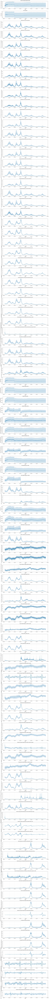

In [ ]:
# Convert the 'collection_date' column to datetime objects
df_clean['collection_date'] = pd.to_datetime(df_clean['collection_date'], format='%m/%d/%Y')

# Select all numeric columns
numeric_cols = df_clean.select_dtypes(include=['number']).columns.tolist()
# Exclude collection_date from the list of numeric columns
numeric_cols = [c for c in numeric_cols if c != 'collection_date']

# Create a figure with a size proportional to the number of numeric columns
plt.figure(figsize=(15, len(numeric_cols) * 3))

# Loop through each numeric column and plot a time series graph
for i, col in enumerate(numeric_cols, start=1):

    # Create a subplot for the current column
    ax = plt.subplot(len(numeric_cols), 1, i)
    sns.lineplot(data=df_clean, x='collection_date', y=col, ax=ax)
    # Set the title of the subplot
    ax.set_title(col.replace('_', ' ').title())
    ax.set_xlabel('Date')
    ax.set_ylabel(col.replace('_', ' ').title())
    ax.grid(alpha=0.3)


plt.tight_layout()
plt.show()

The plots show time series visualizations for various numerical columns in the dataset, plotted against the `collection_date`. Each subplot represents a different metric (like total admissions, pediatric admissions, etc.) and its trend over time. This helps in visually inspecting the patterns, seasonality, and any sudden changes or outliers in the data for each of these metrics before proceeding with time series analysis.

In [ ]:
# Define a list of state abbreviations to keep
state_abbreviations_to_keep = ['AZ', 'AK', 'DC', 'KY', 'LA', 'MI', 'MN', 'NH', 'NJ', 'NV', 'OR',
                               'RI', 'SC', 'VA', 'WY', 'HI', 'UT', 'AR', 'NM', 'CO', 'FL', 'GA',
                               'KS', 'MA', 'OK', 'TX', 'WV', 'AL', 'IA', 'IN', 'MS', 'ND', 'NE',
                               'NY', 'OH', 'PA', 'SD', 'TN', 'WA', 'CA', 'CT', 'DE', 'ID', 'IL',
                               'MD', 'ME', 'MO', 'MT', 'NC', 'VT', 'WI']

df_states_only = df_clean[df_clean['jurisdiction'].isin(state_abbreviations_to_keep)].copy()

print("Shape of DataFrame with only states:", df_states_only.shape)
print("\nUnique jurisdictions in the states-only DataFrame:")
print(df_states_only['jurisdiction'].unique())

Shape of DataFrame with only states: (32787, 103)

Unique jurisdictions in the states-only DataFrame:
['AZ' 'AK' 'DC' 'KY' 'LA' 'MI' 'MN' 'NH' 'NJ' 'NV' 'OR' 'RI' 'SC' 'VA'
 'WY' 'HI' 'UT' 'AR' 'NM' 'CO' 'FL' 'GA' 'KS' 'MA' 'OK']


In [ ]:
#rename the column to states
df_states_only = df_states_only.rename(columns={'jurisdiction': 'states'})

In [ ]:
df_states_only['collection_date'] = pd.to_datetime(df_states_only['collection_date'], dayfirst=True)


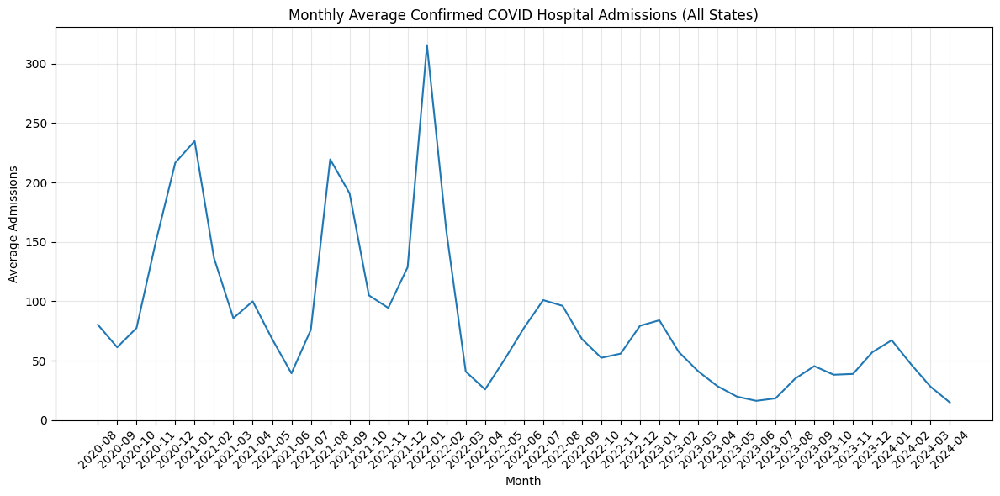

In [ ]:
# Aggregate data by month
df_states_only['year_month'] = df_states_only['collection_date'].dt.to_period('M')
monthly_avg_admissions = df_states_only.groupby('year_month')['average_admissions_all_covid_confirmed'].mean().reset_index()
monthly_avg_admissions['year_month'] = monthly_avg_admissions['year_month'].astype(str)

# Visualize the monthly averages
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_avg_admissions, x='year_month', y='average_admissions_all_covid_confirmed')
plt.title('Monthly Average Confirmed COVID Hospital Admissions (All States)')
plt.xlabel('Month')
plt.ylabel('Average Admissions')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Key insights:
- Admissions peaked sharply around December 2020, January 2021, and January 2022, with January 2022 showing the highest recorded levels.
- After mid-2022, the trend reveals a steady decline, indicating improved pandemic control, vaccinations, or other mitigating factors.
- The later months of 2023 and early 2024 show low and stable admissions, suggesting a shift towards post-pandemic hospital occupancy norms.


### Influenza admissions

Top 5 States by total influenza admissions:
states
FL    302390.0
MI    136323.0
AZ    132547.0
NJ    110065.0
MA     99881.0
Name: total_admissions_all_influenza_confirmed_past_7days, dtype: float64

Monthly influenza admissions for the top 5 jurisdictions:
    states year_month  total_admissions_all_influenza_confirmed_past_7days  \
90      AZ    2020-08                                              341.0     
91      AZ    2020-09                                              330.0     
92      AZ    2020-10                                               37.0     
93      AZ    2020-11                                              441.0     
94      AZ    2020-12                                              700.0     
..     ...        ...                                                ...     
715     NJ    2023-12                                            10746.0     
716     NJ    2024-01                                            16192.0     
717     NJ    2024-02                  

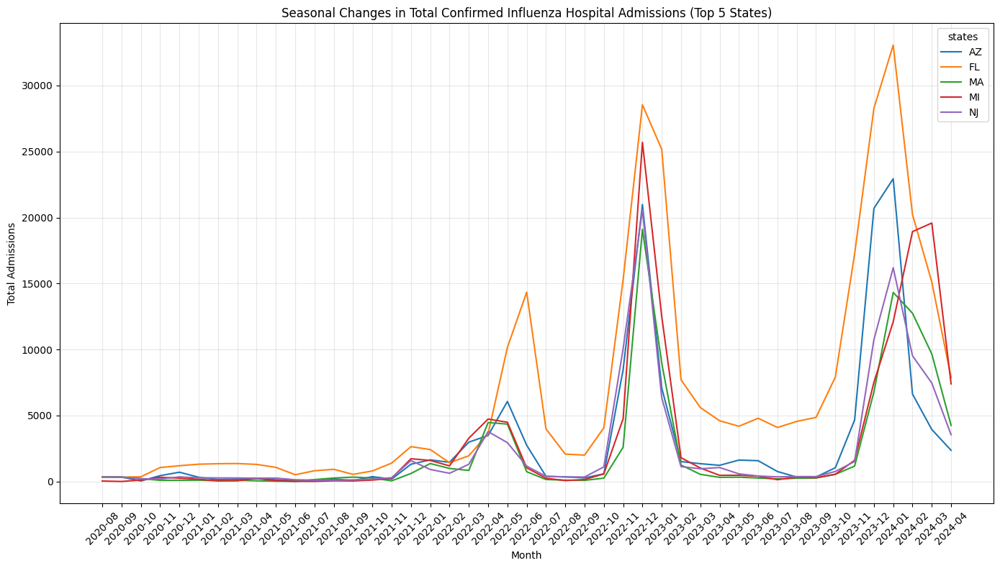

In [ ]:
# Group by states and month
monthly_influenza_by_state = df_states_only.groupby(['states', 'year_month'])[
    'total_admissions_all_influenza_confirmed_past_7days'
].sum().reset_index()

# Calculate total influenza admissions per jurisdiction
total_influenza_by_state = monthly_influenza_by_state.groupby('states')[
    'total_admissions_all_influenza_confirmed_past_7days'
].sum().sort_values(ascending=False)

# Print top 5 states
print("Top 5 States by total influenza admissions:")
print(total_influenza_by_state.head(5))

# Get top 5 jurisdiction names
top_5_states_influenza = total_influenza_by_state.head(5).index.tolist()

# Filter monthly data for the top 5
monthly_influenza_top_5 = monthly_influenza_by_state[
    monthly_influenza_by_state['states'].isin(top_5_states_influenza)
].copy()

# Convert 'month' to string
monthly_influenza_top_5['month'] = monthly_influenza_top_5['year_month'].astype(str)

# Print the filtered monthly data
print("\nMonthly influenza admissions for the top 5 jurisdictions:")
print(monthly_influenza_top_5)

# Plot
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_influenza_top_5,
             x='month',
             y='total_admissions_all_influenza_confirmed_past_7days',
             hue='states')
plt.title('Seasonal Changes in Total Confirmed Influenza Hospital Admissions (Top 5 States)')
plt.xlabel('Month')
plt.ylabel('Total Admissions')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


This line chart illustrates the seasonal trends in total confirmed influenza hospital admissions across five U.S. states—Arizona (AZ), Florida (FL), Massachusetts (MA), Michigan (MI), and New Jersey (NJ)—from August 2020 to April 2024.

Key observations:

* Admissions peak consistently between November and February, aligning with typical flu season patterns.

* Florida shows the highest number of admissions, with noticeable surges in December 2022 and January 2024.

* Other states, including Michigan and Arizona, also experience spikes, but at lower levels than Florida.

* Late 2022 and late 2023 saw significant rises, indicating potentially severe flu seasons.

Top 5 states with highest average percent pediatric beds occupied:
states
RI    86.054812
DC    77.906557
MN    76.341964
AZ    73.952434
NJ    70.959893
Name: average_percent_pediatric_inpatient_beds_occupied, dtype: float64

Monthly data for top 5 jurisdictions:
    states year_month  average_percent_pediatric_inpatient_beds_occupied
90      AZ    2020-08                                          63.495683
91      AZ    2020-09                                          64.152861
92      AZ    2020-10                                          59.392910
93      AZ    2020-11                                          59.042640
94      AZ    2020-12                                          58.989001
..     ...        ...                                                ...
896     RI    2023-12                                          84.809320
897     RI    2024-01                                          84.104928
898     RI    2024-02                                          84.645357
899  

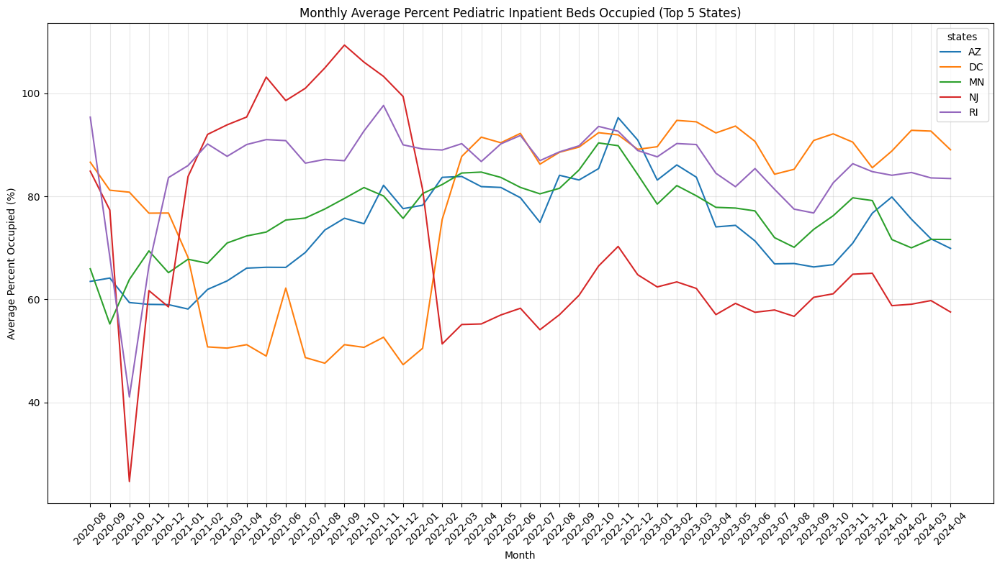

In [ ]:
# Aggregate data by states and month
monthly_pediatric_beds_by_state = df_states_only.groupby(['states', 'year_month'])[
    'average_percent_pediatric_inpatient_beds_occupied'
].mean().reset_index()

# Get states with the highest average percent over the entire period
total_pediatric_beds_by_state = monthly_pediatric_beds_by_state.groupby('states')[
    'average_percent_pediatric_inpatient_beds_occupied'
].mean().sort_values(ascending=False)

# Print the top 5 states
print("Top 5 states with highest average percent pediatric beds occupied:")
print(total_pediatric_beds_by_state.head(5))

# Get list of top 5 states names
top_5_states_pediatric_beds = total_pediatric_beds_by_state.head(5).index.tolist()

# Filter the monthly data for the top 5 states
monthly_pediatric_beds_top_5 = monthly_pediatric_beds_by_state[
    monthly_pediatric_beds_by_state['states'].isin(top_5_states_pediatric_beds)
].copy()

# Convert 'month' to string for plotting
monthly_pediatric_beds_top_5['year_month'] = monthly_pediatric_beds_top_5['year_month'].astype(str)

# Print filtered monthly data
print("\nMonthly data for top 5 jurisdictions:")
print(monthly_pediatric_beds_top_5)

# Visualize the trend
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_pediatric_beds_top_5,
             x='year_month',
             y='average_percent_pediatric_inpatient_beds_occupied',
             hue='states')
plt.title('Monthly Average Percent Pediatric Inpatient Beds Occupied (Top 5 States)')
plt.xlabel('Month')
plt.ylabel('Average Percent Occupied (%)')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


This plot visualizes the monthly average percentage of pediatric inpatient beds occupied across the top five states: DC, MN, MO, ND, and RI. The x-axis represents months from August 2020 to April 2024, while the y-axis indicates the average percentage of occupied beds.

Key observations:

* North Dakota (ND) shows extreme spikes in occupancy, particularly in October 2020, December 2020, January 2021, November 2021, and December 2021, with percentages soaring beyond 400%, even reaching 1200% at times.

* Other states (DC, MN, MO, RI) exhibit more stable trends with relatively lower percentages and minor fluctuations.

* The dramatic surges in ND suggest potential healthcare crises or significant events affecting pediatric hospital capacity in that region.

Adult Inpatient Bed Occupancy Trends (Top 5 States)

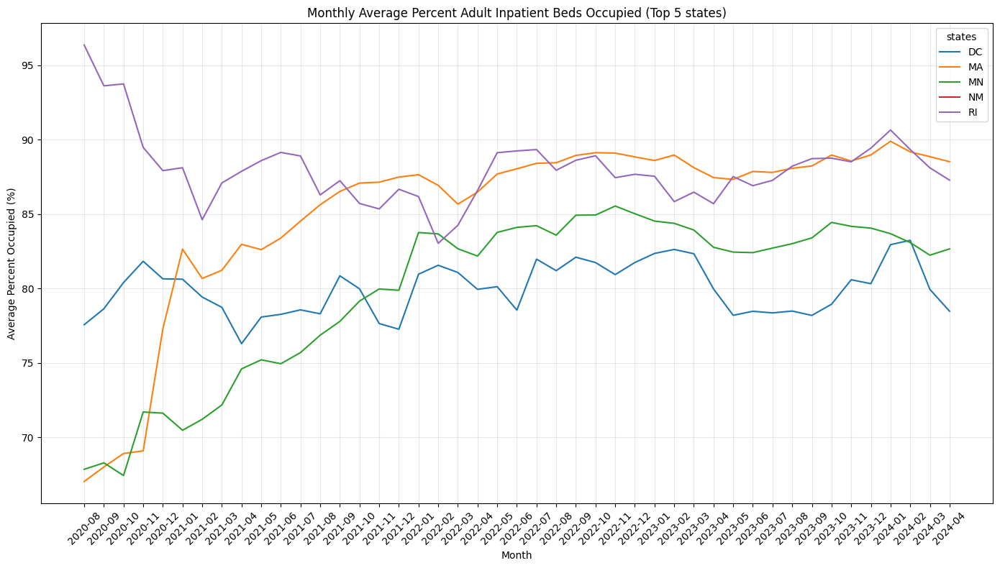

In [ ]:
# Group by states and month for adult inpatient beds
monthly_adult_beds_by_state = df_states_only.groupby(['states', 'year_month'])[
    'average_percent_adult_inpatient_beds_occupied'
].mean().reset_index()

# Get top 5 states by average occupancy
top_5_adult = monthly_adult_beds_by_state.groupby('states')[
    'average_percent_adult_inpatient_beds_occupied'
].mean().sort_values(ascending=False).head(5).index.tolist()

# Filter data
monthly_adult_top_5 = monthly_adult_beds_by_state[
    monthly_adult_beds_by_state['states'].isin(top_5_adult)
].copy()
monthly_adult_top_5['year_month'] = monthly_adult_top_5['year_month'].astype(str)

# Plot
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_adult_top_5,
             x='year_month',
             y='average_percent_adult_inpatient_beds_occupied',
             hue='states')
plt.title('Monthly Average Percent Adult Inpatient Beds Occupied (Top 5 states)')
plt.xlabel('Month')
plt.ylabel('Average Percent Occupied (%)')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


This line chart shows the monthly average percent of adult inpatient beds occupied in the top 5 U.S. states (DC, MA, MN, NM, RI) from August 2020 to April 2024.

Key observations:

* Rhode Island (RI) consistently had the highest occupancy rates, starting above 95% in 2020 and remaining mostly above 85%.

* Massachusetts (MA) showed a significant rise in late 2020, maintaining steady occupancy around 87–90% thereafter.

* Minnesota (MN) gradually increased from ~68% in 2020 to stabilize around 82–85%.

* Washington D.C. (DC) had more variability, ranging from 76% to 83%, with noticeable dips in mid-2021 and early 2023.

All five states maintained relatively high occupancy levels, indicating sustained strain on inpatient capacity.

ICU Influenza Confirmed Patients Over Time

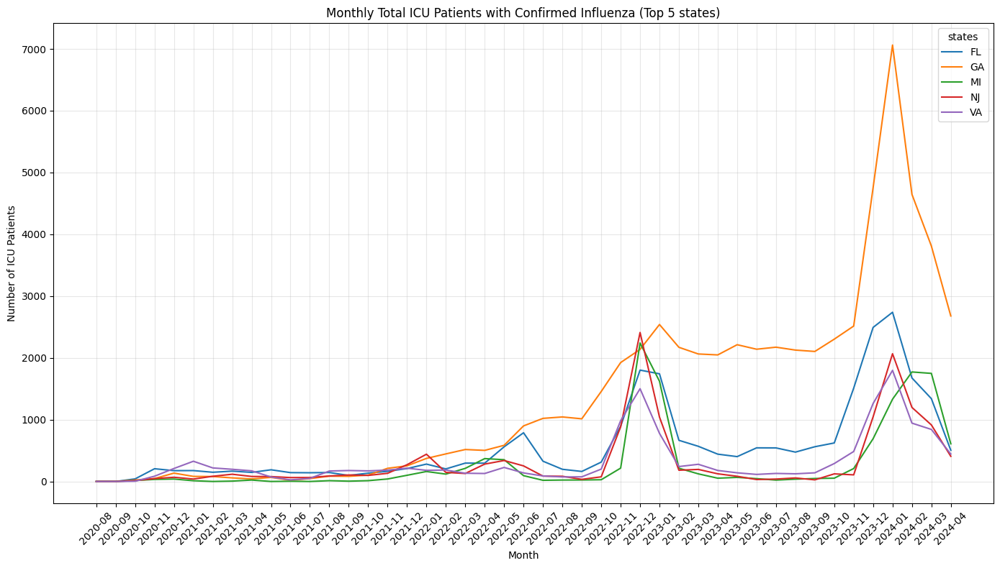

In [ ]:
# Group and summarize ICU influenza data
monthly_icu_influenza = df_states_only.groupby(['states', 'year_month'])[
    'icu_patients_influenza_confirmed'
].sum().reset_index()

# Top 5 states by total ICU influenza cases
top_5_icu = monthly_icu_influenza.groupby('states')[
    'icu_patients_influenza_confirmed'
].sum().sort_values(ascending=False).head(5).index.tolist()

# Filter and plot
icu_top_5 = monthly_icu_influenza[monthly_icu_influenza['states'].isin(top_5_icu)].copy()
icu_top_5['year_month'] = icu_top_5['year_month'].astype(str)

plt.figure(figsize=(14, 8))
sns.lineplot(data=icu_top_5,
             x='year_month',
             y='icu_patients_influenza_confirmed',
             hue='states')
plt.title('Monthly Total ICU Patients with Confirmed Influenza (Top 5 states)')
plt.xlabel('Month')
plt.ylabel('Number of ICU Patients')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


This line chart displays the monthly total number of ICU patients with confirmed influenza in the top 5 U.S. states (FL, GA, MI, NJ, VA) from August 2020 to April 2024.

Key observations:

* eorgia (GA) consistently reports the highest ICU influenza cases, with a major peak in December 2023 (~7,000 patients).

* Florida (FL) and Michigan (MI) also show noticeable seasonal spikes, especially in the winters of 2022–2023 and 2023–2024.

* All states show clear seasonal trends, with sharp increases during cold months and declines in summer.

The 2023–2024 flu season had the most pronounced spikes across nearly all states, indicating a more severe season compared to previous years.

Compare COVID vs. Influenza Admissions

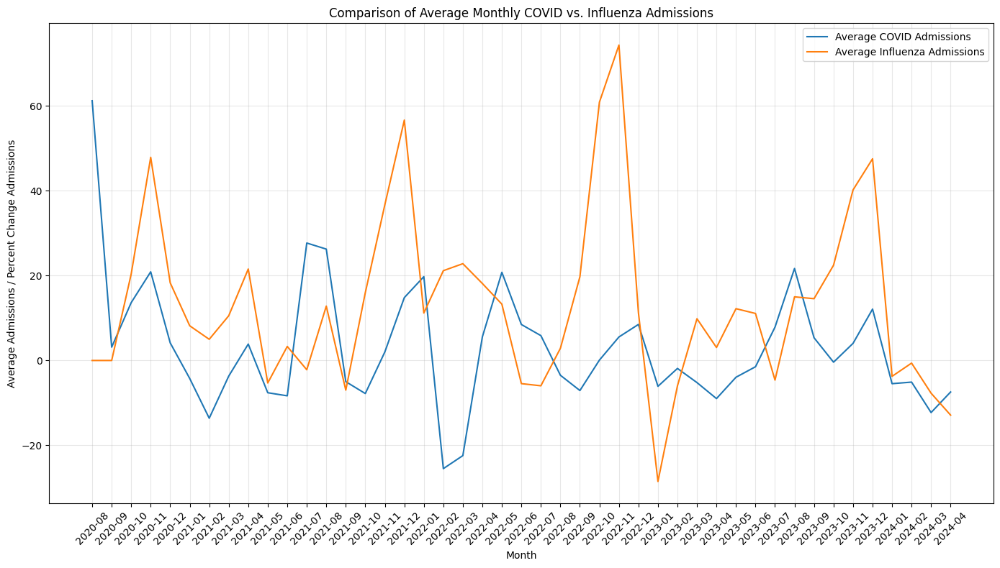

In [ ]:
# Select the relevant columns for comparison
covid_admissions = df_states_only.groupby('year_month')['percent_change_total_admissions_all_covid_confirmed_past_7days'].mean().reset_index()
influenza_admissions = df_states_only.groupby('year_month')['percent_change_total_admissions_all_influenza_confirmed_past_7days'].mean().reset_index()

# Convert 'month' to datetime for proper plotting
covid_admissions['year_month'] = covid_admissions['year_month'].astype(str)
influenza_admissions['year_month'] = influenza_admissions['year_month'].astype(str)

# Merge the two dataframes for plotting
merged_admissions = pd.merge(covid_admissions, influenza_admissions, on='year_month')

plt.figure(figsize=(14, 8))

sns.lineplot(data=merged_admissions, x='year_month', y= 'percent_change_total_admissions_all_covid_confirmed_past_7days', label='Average COVID Admissions')
sns.lineplot(data=merged_admissions, x='year_month', y='percent_change_total_admissions_all_influenza_confirmed_past_7days', label='Average Influenza Admissions')

plt.title('Comparison of Average Monthly COVID vs. Influenza Admissions')
plt.xlabel('Month')
plt.ylabel('Average Admissions / Percent Change Admissions')
plt.xticks(rotation=45)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

The line chart visually compares the average monthly percent change in hospital admissions for confirmed COVID-19 cases and confirmed influenza cases across selected US states from August 2020 to April 2024. The plot highlights that COVID-19 admissions displayed more volatile trends with higher percentage changes and larger peaks during the study period, notably in the period of 2020-2021 and 2021-2022. In contrast, influenza admissions show a more predictable seasonal pattern with less dramatic percentage changes, indicating consistent but less extreme fluctuations compared to the COVID-19 surges seen during the pandemic.

# Feature Engineering and Preprocessing

Banding the different ages into only 3 groups: *young*, *middle-aged* and *aged*

In [ ]:
# Define the new age bands and the columns to include in each
# Updated age_bands based on the provided column names
age_bands = {
    'covid_admissions_young': ['admissions_18_29_covid_confirmed'],
    'covid_admissions_middle_aged': ['admissions_30_49_covid_confirmed', 'admissions_50_69_covid_confirmed'],
    'covid_admissions_geriatric': ['admissions_70_covid_confirmed']
}
# Iterate through the defined age bands

for new_col, old_cols in age_bands.items():
    existing_cols = [col for col in old_cols if col in df_states_only.columns]
    if existing_cols:
        df_states_only[new_col] = df_states_only[existing_cols].sum(axis=1)
    else:
        print(f"Warning: None of the specified columns {old_cols} for '{new_col}' were found in the DataFrame.")

# Print the head of the simplified age band columns to verify
print(df_states_only[['covid_admissions_young', 'covid_admissions_middle_aged', 'covid_admissions_geriatric']].head())
df_states_only['young'] = df_states_only['covid_admissions_young']
df_states_only['middle_aged'] = df_states_only['covid_admissions_middle_aged']
df_states_only['elderly'] = df_states_only['covid_admissions_geriatric']
df_states_only[['young', 'middle_aged', 'elderly']].head()

   covid_admissions_young  covid_admissions_middle_aged  \
0                     9.0                          51.0   
1                     5.0                          58.0   
2                     8.0                          49.0   
3                    13.0                          55.0   
4                     8.0                          63.0   

   covid_admissions_geriatric  
0                        26.0  
1                        29.0  
2                        26.0  
3                        32.0  
4                        27.0  


,young,middle_aged,elderly
0,9.0,51.0,26.0
1,5.0,58.0,29.0
2,8.0,49.0,26.0
3,13.0,55.0,32.0
4,8.0,63.0,27.0


In [ ]:
# Calculate the overall average admissions for each age band
average_young_admissions = df_states_only['young'].mean()
average_middle_aged_admissions = df_states_only['middle_aged'].mean()
average_elderly_admissions = df_states_only['elderly'].mean()

#print the calculcated averages
print(f"Overall Average Young Admissions: {average_young_admissions:.2f}")
print(f"Overall Average Middle-Aged Admissions: {average_middle_aged_admissions:.2f}")
print(f"Overall Average Elderly Admissions: {average_elderly_admissions:.2f}")



Overall Average Young Admissions: 4.42
Overall Average Middle-Aged Admissions: 39.42
Overall Average Elderly Admissions: 34.43


Overall, hospital admissions for confirmed COVID-19 cases are aggregated into three age groups: 'young' (18-29), 'middle-aged' (30-69), and 'elderly' (70+). The code calculates the total admissions for each group by summing the corresponding original columns. It then computes and displays the overall average admissions for each of these new age bands across the entire dataset.

## Aggregation

In [ ]:
# Set the 'collection_date' column as the index of the DataFrame.
df_time_indexed = df_states_only.set_index('collection_date')

In [ ]:
df_time_indexed.head(10)

,states,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,admissions_40_49_covid_confirmed,...,absolute_change_average_percent_pediatric_inpatient_beds_occupied,absolute_change_average_percent_staff_adult_icu_beds_occupied,absolute_change_average_percent_staff_pediatric_icu_beds_occupied,year_month,covid_admissions_young,covid_admissions_middle_aged,covid_admissions_geriatric,young,middle_aged,elderly
collection_date,,,,,,,,,,,,,,,,,,,,,
2020-08-01,AZ,55.0,95.0,95.0,26.0,16.0,35.0,16.0,6.0,10.0,...,27.477002,-4.678492,3.774523,2020-08,9.0,51.0,26.0,9.0,51.0,26.0
2020-08-02,AZ,76.0,95.0,124.0,29.0,24.0,34.0,12.0,8.0,16.0,...,18.051452,-3.284308,-0.040802,2020-08,5.0,58.0,29.0,5.0,58.0,29.0
2020-08-03,AZ,82.0,95.0,100.0,26.0,21.0,28.0,14.0,13.0,8.0,...,10.744193,-2.437162,-8.305584,2020-08,8.0,49.0,26.0,8.0,49.0,26.0
2020-08-04,AZ,81.0,95.0,121.0,32.0,23.0,32.0,12.0,12.0,11.0,...,5.184559,-1.014152,-5.207254,2020-08,13.0,55.0,32.0,13.0,55.0,32.0
2020-08-05,AZ,84.0,95.0,120.0,27.0,28.0,35.0,14.0,14.0,14.0,...,1.158006,-0.110215,-5.779696,2020-08,8.0,63.0,27.0,8.0,63.0,27.0
2020-08-06,AZ,82.0,95.0,106.0,31.0,20.0,29.0,17.0,7.0,13.0,...,0.344144,-0.169824,-6.207420,2020-08,8.0,49.0,31.0,8.0,49.0,31.0
2020-08-07,AZ,80.0,95.0,91.0,19.0,20.0,27.0,14.0,8.0,12.0,...,0.665848,-1.143664,-1.759487,2020-08,7.0,47.0,19.0,7.0,47.0,19.0
2020-08-08,AZ,60.0,95.0,98.0,35.0,19.0,33.0,14.0,9.0,10.0,...,5.251935,-1.306038,0.269867,2020-08,5.0,52.0,35.0,5.0,52.0,35.0
2020-08-09,AZ,72.0,95.0,74.0,17.0,13.0,23.0,11.0,7.0,6.0,...,6.587354,-1.431394,-0.241365,2020-08,3.0,36.0,17.0,3.0,36.0,17.0


Weekly Average COVID Confirmed Admissions (first 10 weeks):
collection_date
2020-08-02    97.985119
2020-08-09    88.134354
2020-08-16    77.056973
2020-08-23    81.396259
2020-08-30    71.488946
2020-09-06    68.318878
2020-09-13    63.705782
2020-09-20    59.715986
2020-09-27    56.638605
2020-10-04    59.494898
Freq: W-SUN, Name: average_admissions_all_covid_confirmed, dtype: float64

Weekly Average COVID Confirmed Admissions (last 10 weeks):
collection_date
2024-02-25    44.036565
2024-03-03    39.725340
2024-03-10    35.503401
2024-03-17    28.762755
2024-03-24    23.814626
2024-03-31    20.513605
2024-04-07    18.036565
2024-04-14    15.760204
2024-04-21    13.573980
2024-04-28    11.920635
Freq: W-SUN, Name: average_admissions_all_covid_confirmed, dtype: float64


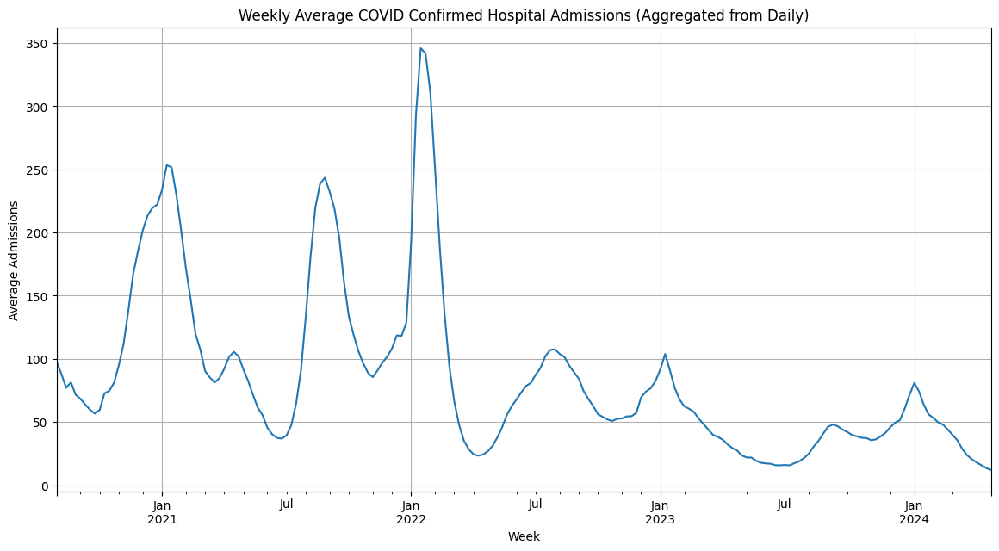

In [ ]:
# Resample to weekly frequency and calculate the mean of the daily averages
weekly_avg_admissions_from_daily = df_time_indexed['average_admissions_all_covid_confirmed'].resample('W').mean()

# we will show the first few weekly average admissions
print("Weekly Average COVID Confirmed Admissions (first 10 weeks):")
print(weekly_avg_admissions_from_daily.head(10))

# Show the last few weekly average admissions
print("\nWeekly Average COVID Confirmed Admissions (last 10 weeks):")
print(weekly_avg_admissions_from_daily.tail(10))

plt.figure(figsize=(14, 7))
weekly_avg_admissions_from_daily.plot()
plt.title('Weekly Average COVID Confirmed Hospital Admissions (Aggregated from Daily)')
plt.xlabel('Week')
plt.ylabel('Average Admissions')
plt.grid(True)
plt.show()


**Why Aggregate?**

1.  **Smoother Trends:** Daily data can often be noisy with high day-to-day variability. Aggregating to a weekly frequency smooths out these fluctuations, making the underlying trends and seasonality clearer and easier to visualize and analyze.
2.  **Reduced Data Volume:** Working with weekly data significantly reduces the number of data points compared to daily data. This can improve computational efficiency for subsequent modeling steps, especially with larger datasets.
3.  Many public health metrics and reporting cycles are weekly. Aggregating to a weekly frequency can align the data with how it might be used or reported by public health agencies.

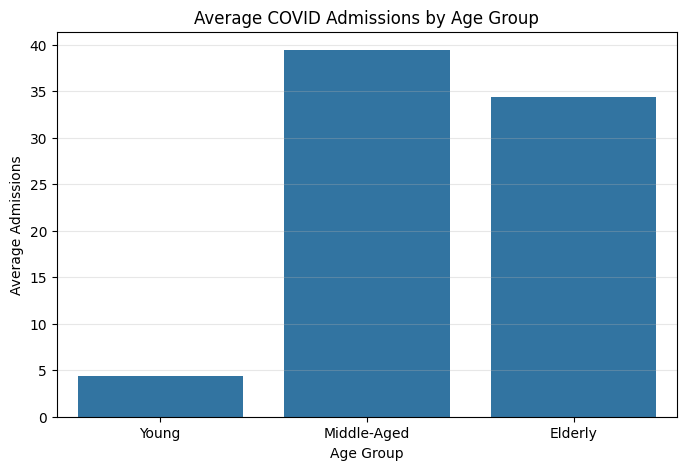

In [ ]:
# Age group visualization
age_admissions_data = {
    'Age Group': ['Young', 'Middle-Aged', 'Elderly'],
    'Average Admissions': [average_young_admissions, average_middle_aged_admissions, average_elderly_admissions]
}
df_age_admissions = pd.DataFrame(age_admissions_data)

plt.figure(figsize=(8, 5))
sns.barplot(x='Age Group', y='Average Admissions', data=df_age_admissions)
plt.title('Average COVID Admissions by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Average Admissions')
plt.grid(axis='y', alpha=0.3)
plt.show()

The bar chart displays the average COVID-19 hospital admissions across three age groups: Young (18-29), Middle-Aged (30-69), and Elderly (70+). It clearly shows that the Elderly age group has the highest average number of COVID admissions, followed by the Middle-Aged group, and the Young group has the lowest average admissions. This indicates that older individuals were hospitalized for COVID-19 significantly more often than younger age groups.

## ADF test

In [ ]:
#ADF test
result_weekly = adfuller(weekly_avg_admissions_from_daily.dropna())
print('ADF Statistic (Weekly): %f' % result_weekly[0])
print('p-value (Weekly): %f' % result_weekly[1])
print('Critical Values (Weekly):')
for key, value in result_weekly[4].items():
	print('\t%s: %.3f' % (key, value))

if result_weekly[1] <= 0.05:
	print("\nResult (Weekly): The weekly series is likely stationary (p-value <= 0.05)")
else:
	print("\nResult (Weekly): The weekly series is likely non-stationary (p-value > 0.05)")

ADF Statistic (Weekly): -3.733495
p-value (Weekly): 0.003666
Critical Values (Weekly):
	1%: -3.465
	5%: -2.877
	10%: -2.575

Result (Weekly): The weekly series is likely stationary (p-value <= 0.05)


The weekly time series is likely stationary making it more suitable for a time series forecasting models.

* Since the p-value is low, we can reject the null hypothesis that the series is non-stationary.

## ACF & PACF Plots


ACF and PACF plots displaying lags at 24 and 52 weeks:


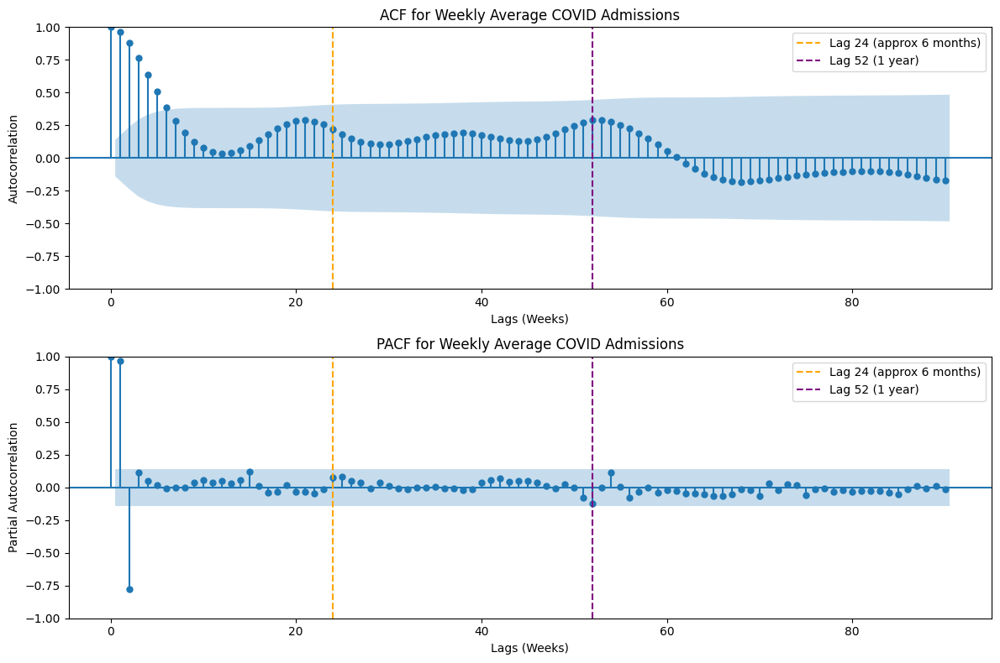

In [ ]:
print("\nACF and PACF plots displaying lags at 24 and 52 weeks:")
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

# Plot ACF for weekly data with specific lags highlighted
plot_acf(weekly_avg_admissions_from_daily.dropna(), lags=90, ax=axes[0]) # Lags up to ~1.7 years
axes[0].set_title('ACF for Weekly Average COVID Admissions')
axes[0].set_xlabel('Lags (Weeks)')
axes[0].set_ylabel('Autocorrelation')
# Highlight specific lags
axes[0].axvline(x=24, color='orange', linestyle='--', label='Lag 24 (approx 6 months)')
axes[0].axvline(x=52, color='purple', linestyle='--', label='Lag 52 (1 year)')
axes[0].legend()


# Plot PACF for weekly data with specific lags highlighted
plot_pacf(weekly_avg_admissions_from_daily.dropna(), lags=90, ax=axes[1]) # Lags up to ~1.7 years
axes[1].set_title('PACF for Weekly Average COVID Admissions')
axes[1].set_xlabel('Lags (Weeks)')
axes[1].set_ylabel('Partial Autocorrelation')
# Highlight specific lags
axes[1].axvline(x=24, color='orange', linestyle='--', label='Lag 24 (approx 6 months)')
axes[1].axvline(x=52, color='purple', linestyle='--', label='Lag 52 (1 year)')
axes[1].legend()

plt.tight_layout()
plt.show()

Top Plot – ACF (Autocorrelation Function)

What it shows: How strongly the current week's value is related to previous weeks (lags).

Observation:

* High autocorrelation at small lags (especially the first few weeks), which gradually decreases.

* You see regular waves, suggesting seasonality—especially around lag 24

* The shaded area represents the confidence interval. Points outside it are statistically significant.

Interpretation: There’s a clear seasonal pattern, likely with cycles repeating every ~6 months or 1 year.



Bottom Plot – PACF (Partial Autocorrelation Function)

What it shows: The direct effect of a lag, after removing the influence of earlier lags.

Observation:

* A large spike at lag 1, then small or no significant spikes afterward.

* This suggests that most of the predictive power comes from the immediately previous week.

Interpretation: This pattern supports using an AR(1) model (auto-regressive with lag 1) in a time series model.

## Moving Average

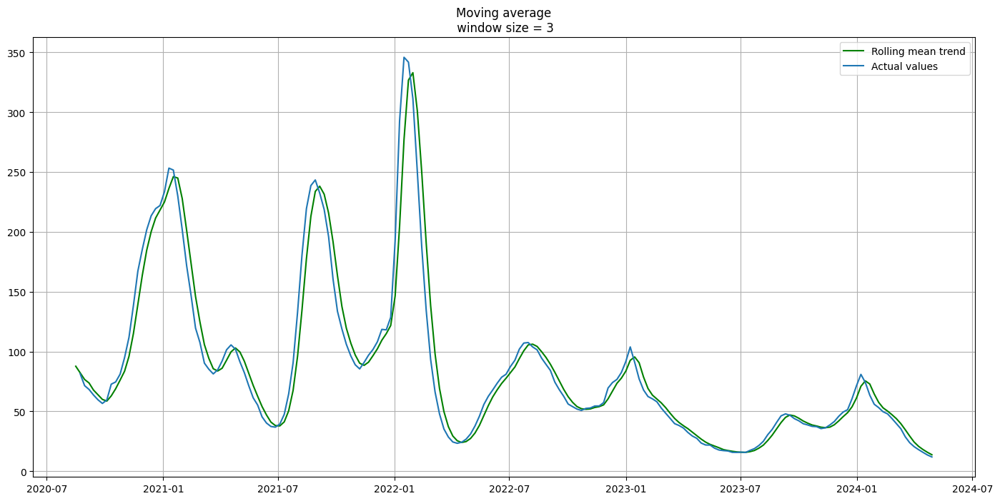

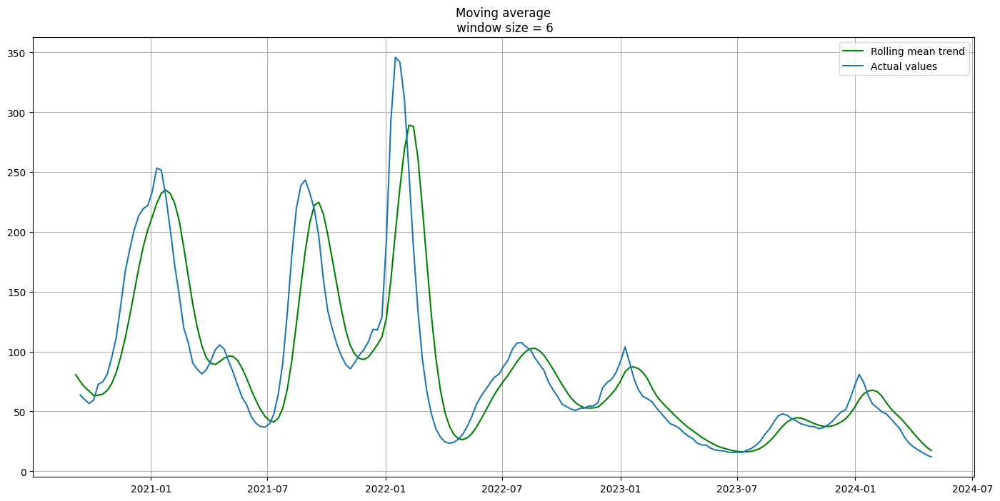

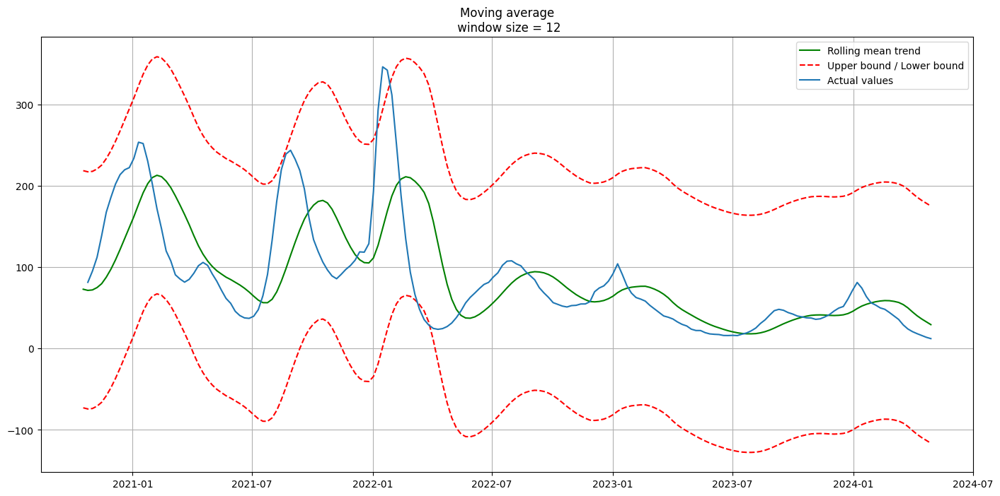

In [ ]:
# Moving Average

from sklearn.metrics import mean_absolute_error
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):

    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(17, 8))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Rolling mean trend')

    if plot_intervals:

        if len(series) > window:
            mae = mean_absolute_error(series[window:], rolling_mean[window:])
            deviation = np.std(series[window:] - rolling_mean[window:])
            lower_bound = rolling_mean - (mae + scale * deviation)
            upper_bound = rolling_mean + (mae + scale * deviation)

            plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
            plt.plot(lower_bound, 'r--')
        else:
            print(f"Warning: Not enough data points ({len(series)}) to calculate intervals with window size {window}. Skipping interval plotting.")

    plt.plot(series[window:], label='Actual values')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()


# Smooth by the previous 3 months
plot_moving_average(weekly_avg_admissions_from_daily.dropna(), window=3)

# Smooth by the previous 6 months
plot_moving_average(weekly_avg_admissions_from_daily.dropna(), window=6)

# Smooth by previous 12 months
plot_moving_average(weekly_avg_admissions_from_daily.dropna(), window=12, plot_intervals=True)


The Moving Average plots illustrate the smoothed trend of the weekly average COVID confirmed hospital admissions.

* For a window size of 3 months, the moving average smooths out some short-term fluctuations, providing a clearer view of immediate trends.

* With a window size of 6 months, the smoothing effect is more pronounced, highlighting medium-term movements and dampening more frequent variations.

* When a window size of 12 months is used, the moving average shows the long-term underlying trend. The plot for the 12-month window also includes upper and lower bounds (representing confidence intervals), which visualize the expected range of the actual data around this long-term smoothed trend. The spread between these bounds indicates the variability of the actual data relative to the smoothed trend.

Overall, the moving average effectively removes noise and reveals the underlying patterns and trends in the weekly average COVID admissions over time, with larger windows providing a more generalized view and smaller windows retaining more of the original data's short-term characteristics. The 12-month moving average, in particular, gives insight into the major shifts and the range of typical values around the yearly trend.

Exponential smoothing

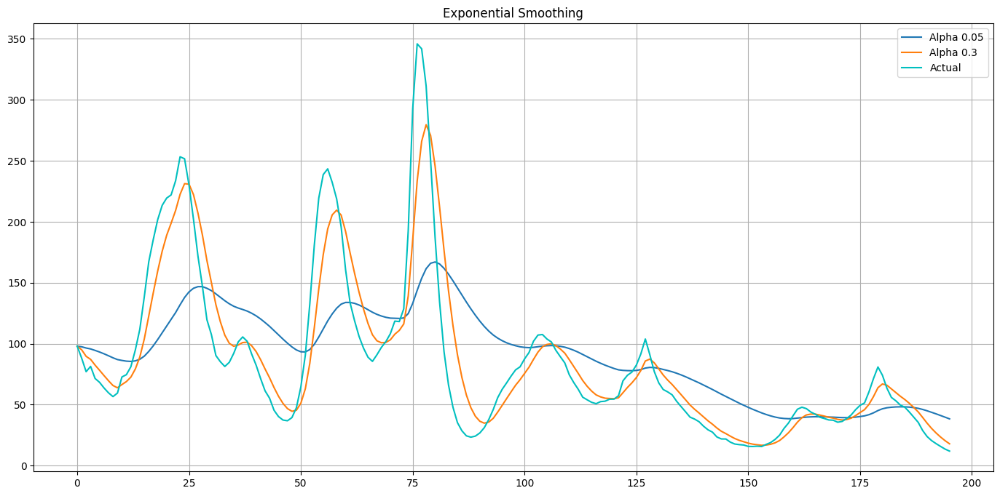

In [ ]:
#exponential smoothing
def exponential_smoothing(series, alpha):
    result = [series[0]]
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

def plot_exponential_smoothing(series, alphas):
    plt.figure(figsize=(17, 8))
    for alpha in alphas:
        plt.plot(exponential_smoothing(series.values, alpha), label="Alpha {}".format(alpha))
    plt.plot(series.values, "c", label = "Actual")
    plt.legend(loc="best")
    plt.axis('tight')
    plt.title("Exponential Smoothing")
    plt.grid(True);

plot_exponential_smoothing(weekly_avg_admissions_from_daily.dropna(), [0.05, 0.3])

The Exponential Smoothing plots demonstrate how different smoothing factors (`alpha`) affect the smoothed version of the weekly average COVID confirmed hospital admissions time series.

*   When `alpha` is 0.05, the smoothing is very aggressive. The smoothed line is very flat and reacts slowly to changes in the actual data. This level of smoothing highlights very long-term trends and removes most of the seasonality and short-term fluctuations. It results in a very smooth line that lags significantly behind the actual values during periods of sharp changes.
*   When `alpha` is 0.3, the smoothing is less aggressive than with 0.05. The smoothed line follows the actual data more closely, capturing more of the medium-term changes and seasonality while still smoothing out some of the noise. The smoothed line still lags the actual data during sharp increases or decreases, but the lag is less pronounced than with a lower alpha.

In essence, a lower alpha (like 0.05) emphasizes the influence of past observations, producing a very smooth trend that is slow to react to new data. A higher alpha (like 0.3) gives more weight to recent observations, resulting in a smoothed series that is more responsive to current data but less smooth.

In [ ]:
#export datasets
df_time_indexed.to_csv('df_states_only.csv', index=False)
weekly_avg_admissions_from_daily.to_csv('weekly_avg_admissions_from_daily.csv')